# <center>**Analyse de réseaux - Country Space**

## Préambule

### Mobilisation des librairies

In [1]:
#%pip install pandas networkx numpy matplotlib scipy statsmodels python-louvain openpyxl
#!pip list
#!pip3 freeze
#!pip3 freeze > requirements.txt

In [2]:
import os
import sys
from pathlib import Path

sys.path.insert(0, str((Path("..") / "src").resolve()))

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import networkx as nx
import statsmodels.api as sm
import community.community_louvain as louvain
from libs.mrqap import MRQAP

### Chemin d'accès

In [3]:
### Répertoire de travail (le notebook vit dans notebook/, la racine du dépôt est son parent) ###
chemin = Path("..").resolve()
print("Chemin de travail : ", chemin)

chemin_graph = chemin / "figure"
chemin_graph.mkdir(exist_ok=True)

chemin_resultat = chemin / "table"
chemin_resultat.mkdir(exist_ok=True)

Chemin de travail :  /Users/marius/Desktop/Perso/Projets/git/released/Network-Analysis-Country-Space-KOR


### Importer les données

In [4]:
fichier_2008 = os.path.join(chemin, "data", "Country_Space_2008.csv")
df = pd.read_csv(fichier_2008)

fichier_1998 = os.path.join(chemin, "data", "Country_Space_1998.csv")
df_1 = pd.read_csv(fichier_1998)

In [5]:
df

,country_code_BACI,country_name,iso3,AFG,ALB,DZA,AND,AGO,ATG,AZE,...,EGY,GBR,TZA,USA,BFA,URY,UZB,VEN,YEM,ZMB
0,4,Afghanistan,AFG,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.107143,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000
1,8,Albania,ALB,0.0,0.000000,0.0,0.147982,0.000000,0.000000,0.122449,...,0.214286,0.000000,0.000000,0.000000,0.0000,0.000000,0.112245,0.118143,0.000000,0.000000
2,12,Algeria,DZA,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000
3,20,Andorra,AND,0.0,0.147982,0.0,0.000000,0.210762,0.000000,0.130045,...,0.121076,0.000000,0.000000,0.000000,0.3125,0.000000,0.000000,0.248945,0.000000,0.139013
4,24,Angola,AGO,0.0,0.000000,0.0,0.210762,0.000000,0.000000,0.111702,...,0.000000,0.000000,0.000000,0.111702,0.2000,0.000000,0.000000,0.126582,0.000000,0.117021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,858,Uruguay,URY,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.106383,0.000000,0.000000,0.000000
186,860,Uzbekistan,UZB,0.0,0.112245,0.0,0.000000,0.000000,0.148936,0.126316,...,0.108696,0.191489,0.000000,0.000000,0.0000,0.106383,0.000000,0.000000,0.186441,0.000000
187,862,Venezuela,VEN,0.0,0.118143,0.0,0.248945,0.126582,0.000000,0.130802,...,0.000000,0.000000,0.000000,0.000000,0.1750,0.000000,0.000000,0.000000,0.130802,0.198312
188,887,Yemen,YEM,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.105263,...,0.163043,0.101695,0.000000,0.000000,0.0000,0.000000,0.186441,0.130802,0.000000,0.211864


In [6]:
df_1

,country_code_BACI,country_name,iso3,AFG,ALB,DZA,AGO,AZE,ARG,AUS,...,TZA,USA,PUS,BFA,URY,UZB,VEN,YEM,SCG,ZMB
0,4,Afghanistan,AFG,0.000000,0.000000,0.105263,0.000000,0.240741,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,8,Albania,ALB,0.000000,0.000000,0.000000,0.112583,0.000000,0.000000,0.102703,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,12,Algeria,DZA,0.105263,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.157895,0.000000,0.000000,0.000000
3,24,Angola,AGO,0.000000,0.112583,0.000000,0.000000,0.000000,0.158940,0.151351,...,0.184971,0.000000,0.105960,0.000000,0.000000,0.367089,0.000000,0.166667,0.119205,0.165563
4,31,Azerbaijan,AZE,0.240741,0.000000,0.000000,0.000000,0.000000,0.000000,0.102703,...,0.000000,0.000000,0.000000,0.114286,0.106061,0.000000,0.000000,0.105691,0.104762,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,860,Uzbekistan,UZB,0.000000,0.000000,0.000000,0.367089,0.000000,0.132911,0.167568,...,0.156069,0.000000,0.132911,0.000000,0.000000,0.000000,0.000000,0.000000,0.132911,0.158228
163,862,Venezuela,VEN,0.000000,0.000000,0.157895,0.000000,0.000000,0.142857,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
164,887,Yemen,YEM,0.000000,0.000000,0.000000,0.166667,0.105691,0.000000,0.268293,...,0.199187,0.206422,0.113821,0.166667,0.000000,0.000000,0.000000,0.000000,0.166667,0.235772
165,891,Serbia and Montenegro (...2005),SCG,0.000000,0.000000,0.000000,0.119205,0.104762,0.000000,0.156757,...,0.132948,0.000000,0.200000,0.000000,0.000000,0.132911,0.000000,0.166667,0.000000,0.304000


### Mettre le dataframe sous forme de matrice carré

In [7]:
print(df.columns)
print(type(df))

print(df_1.columns)
print(type(df_1))

Index(['country_code_BACI', 'country_name', 'iso3', 'AFG', 'ALB', 'DZA', 'AND',
       'AGO', 'ATG', 'AZE',
       ...
       'EGY', 'GBR', 'TZA', 'USA', 'BFA', 'URY', 'UZB', 'VEN', 'YEM', 'ZMB'],
      dtype='object', length=193)
<class 'pandas.core.frame.DataFrame'>
Index(['country_code_BACI', 'country_name', 'iso3', 'AFG', 'ALB', 'DZA', 'AGO',
       'AZE', 'ARG', 'AUS',
       ...
       'TZA', 'USA', 'PUS', 'BFA', 'URY', 'UZB', 'VEN', 'YEM', 'SCG', 'ZMB'],
      dtype='object', length=170)
<class 'pandas.core.frame.DataFrame'>


In [8]:
# Supprimer les colonnes inutiles et définir l'iso3 comme nom de ligne
df = df.set_index("iso3")
df = df.drop(columns=["country_code_BACI", "country_name"])
print(df.head())

df_1 = df_1.set_index("iso3")
df_1 = df_1.drop(columns=["country_code_BACI", "country_name"])
print(df_1.head())

      AFG       ALB  DZA       AND       AGO  ATG       AZE       ARG  \
iso3                                                                    
AFG   0.0  0.000000  0.0  0.000000  0.000000  0.0  0.000000  0.000000   
ALB   0.0  0.000000  0.0  0.147982  0.000000  0.0  0.122449  0.139303   
DZA   0.0  0.000000  0.0  0.000000  0.000000  0.0  0.000000  0.000000   
AND   0.0  0.147982  0.0  0.000000  0.210762  0.0  0.130045  0.161435   
AGO   0.0  0.000000  0.0  0.210762  0.000000  0.0  0.111702  0.144279   

           AUS       AUT  ...       EGY  GBR       TZA       USA     BFA  URY  \
iso3                      ...                                                   
AFG   0.000000  0.000000  ...  0.000000  0.0  0.107143  0.000000  0.0000  0.0   
ALB   0.000000  0.165049  ...  0.214286  0.0  0.000000  0.000000  0.0000  0.0   
DZA   0.000000  0.000000  ...  0.000000  0.0  0.000000  0.000000  0.0000  0.0   
AND   0.147982  0.107623  ...  0.121076  0.0  0.000000  0.000000  0.3125  0.0   
AG

In [9]:
print("L'objet est-il un dataframe ? :", isinstance(df, pd.DataFrame))

print("La matrice est-elle carré ? ", df.shape[0] == df.shape[1])

diagonale = np.diag(df.to_numpy())
print("La diagonale  est nulle ? ", (diagonale == 0).all())

print("La matrice est-elle symétrique ? ", np.allclose(df, df.T))

positif = np.all(df >= 0)
print("La matrice constinet que des coefficients positif ?", positif)

L'objet est-il un dataframe ? : True
La matrice est-elle carré ?  True
La diagonale  est nulle ?  True
La matrice est-elle symétrique ?  True
La matrice constinet que des coefficients positif ? True


In [10]:
print("L'objet est-elle un dataframe ? :", isinstance(df_1, pd.DataFrame))

print("La matrice est-elle carré ? ", df_1.shape[0] == df_1.shape[1])

diagonale = np.diag(df_1.to_numpy())
print("La diagonale  est nulle ? ", (diagonale == 0).all())

print("La matrice est-elle symétrique ? ", np.allclose(df_1, df_1.T))

positif = np.all(df_1 >= 0)
print("La matrice constinet que des coefficients positif ?", positif)

L'objet est-elle un dataframe ? : True
La matrice est-elle carré ?  True
La diagonale  est nulle ?  True
La matrice est-elle symétrique ?  True
La matrice constinet que des coefficients positif ? True


Les matrices sont des matrices carrées, symétriques et leur diagonale est nulle. Les réseaux sont donc non orientés (symétriques) et les nœuds n'interagissent pas avec eux-mêmes (diagonale nulle).

## I - Analyse dans son ensemble (MONDE) 

### <center> 2008

In [11]:
# Créer le graphe à partir de la matrice
graph = nx.from_pandas_adjacency(df)

### Représentation visuelle du réseau Monde

#### Diagramme sans pondération sur les noeuds

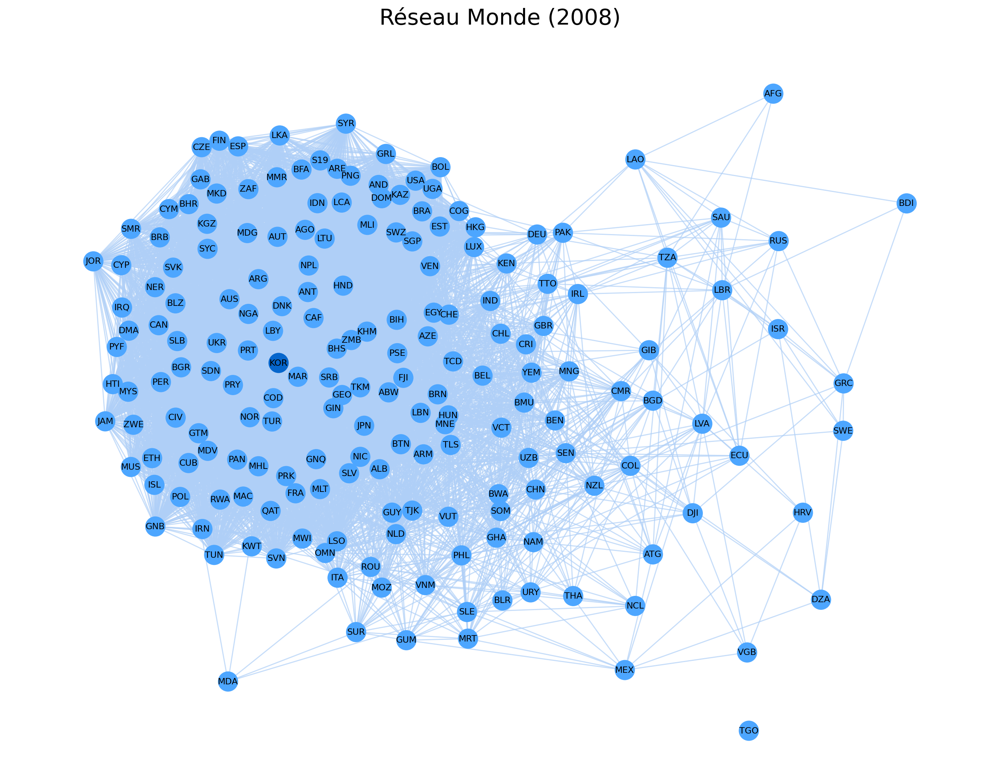

In [12]:
plt.figure(figsize=(16, 12), dpi=200)

node_colors = ["#0666CC" if node == "KOR" else "#4DA6FF" for node in graph.nodes()]

pos = nx.kamada_kawai_layout(graph)
pos["TGO"] = (0.3, -0.3)

nx.draw_networkx_edges(graph, pos, alpha=0.7, edge_color="#AFCFF7")
nx.draw_networkx_nodes(graph, pos, node_color=node_colors, node_size=300)
nx.draw_networkx_labels(graph, pos, font_size=8)

plt.title("Réseau Monde (2008)", fontsize=20)
plt.axis("off")

reseau_monde = os.path.join(chemin_graph, "reseau_monde_2008_non_pondere.png")
plt.savefig(reseau_monde)

plt.show()

#### Diagramme avec pondération sur les noeuds

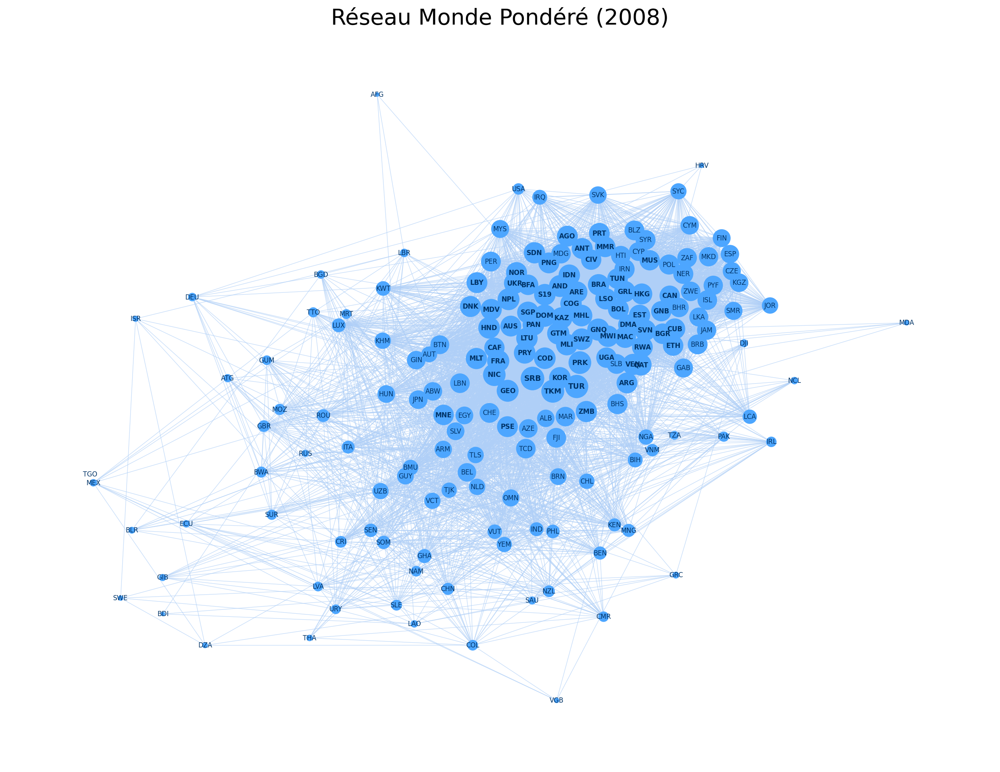

In [13]:
plt.figure(figsize=(16, 12), dpi= 200)
pos = nx.spring_layout(graph, seed=42, k=0.5, iterations=50)
d = dict(graph.degree)
node_sizes = [v * 3 for v in d.values()]
nx.draw_networkx_nodes(graph, pos, 
                       node_size=node_sizes, 
                       node_color="#4DA6FF", 
                       linewidths=1)
for node, degree in d.items():

    taille = degree * 0.05 
    taille_finale = max(taille, 6) 
    nx.draw_networkx_labels(graph, pos, 
                            labels={node: node}, 
                            font_size=taille_finale,
                            font_color="#003366",
                            font_weight='bold' if degree > 100 else 'normal')
nx.draw_networkx_edges(graph, pos, 
                       edge_color="#AFCFF7", 
                       alpha=0.7,
                       width=0.5)

plt.title("Réseau Monde Pondéré (2008)", fontsize=20)
plt.axis('off')

reseau_monde = os.path.join(chemin_graph, "reseau_monde_2008.png")
plt.savefig(reseau_monde)

plt.show()

### Description du réseau

In [14]:
"""
Notions relatifs à la structure du réseau : 
- Diamètre : plus grande distance entre deux sommets
- Rayon : plus petite excentricité du graphe
- Centre : sommets d'excentricité minimale
- Périphérie : sommets d'excentricité maximale
- Barycentre : sommets minimisant la distance moyenne aux autres
"""

### Propriétés de base ###
nb_node = graph.number_of_nodes()
nb_edge = graph.number_of_edges()
print("Nombre de noeuds :", nb_node)
print("Nombre d'arêtes :", nb_edge)

orient = graph.is_directed()
print("Le graphe est-il orienté ? :", orient)

connexe = nx.is_connected(graph)
print("Le graphe est-il connexe ? :", connexe)

nb_composante = nx.number_connected_components(graph)
print("Nombre de composantes connexes :", nb_composante)

dens = nx.density(graph)
print("Densité du réseau :", dens)

### Grandeures topologique ###
# Calculs sur le graphe complet ou sur la composante géante si non connexe

if connexe == True:
    diametre = nx.diameter(graph)
    print("Diamètre du graphe :", diametre)
    
    rayon = nx.radius(graph)
    print("Rayon du graphe :", rayon)
    
    centre = nx.center(graph)
    print("Centre du graphe :", centre)
    
    periph = nx.periphery(graph)
    print("Sommets périphériques :", periph)
    
    barycentre = nx.center(graph, usebounds=True)
    print("Barycentre du graphe :", barycentre)
    
    barycentre_value = nx.barycenter(graph, weight="weight")
    print("Barycentre (valué) :", barycentre_value)

else:
    print("Le graphe n'est pas connexe, calculs sur la plus grande composante")
    composantes = list(nx.connected_components(graph))
    composante_geante = max(composantes, key=len)
    sous_graphe = graph.subgraph(composante_geante).copy()
    
    diametre = nx.diameter(sous_graphe)
    print("Diamètre de la composante géante :", diametre)
    
    rayon = nx.radius(sous_graphe)
    print("Rayon de la composante géante :", rayon)
    
    centre = nx.center(sous_graphe)
    print("Centre de la composante géante :", centre)
    
    periph = nx.periphery(sous_graphe)
    print("Sommets périphériques :", periph)
    
    barycentre = nx.center(sous_graphe, usebounds=True)
    print("Barycentre de la composante géante :", barycentre)
    
    barycentre_value = nx.barycenter(sous_graphe, weight="weight")
    print("Barycentre (valué) :", barycentre_value)

Nombre de noeuds : 190
Nombre d'arêtes : 7006
Le graphe est-il orienté ? : False
Le graphe est-il connexe ? : False
Nombre de composantes connexes : 2
Densité du réseau : 0.390197716513506
Le graphe n'est pas connexe, calculs sur la plus grande composante
Diamètre de la composante géante : 4
Rayon de la composante géante : 3
Centre de la composante géante : ['ALB', 'AND', 'AGO', 'ATG', 'AZE', 'ARG', 'BHS', 'BGD', 'ARM', 'BEL', 'BMU', 'BTN', 'BIH', 'BWA', 'BRA', 'BRN', 'MMR', 'BLR', 'KHM', 'CMR', 'TCD', 'CHL', 'CHN', 'COL', 'COG', 'COD', 'CRI', 'HRV', 'BEN', 'DNK', 'DOM', 'SLV', 'GNQ', 'EST', 'FJI', 'FRA', 'DJI', 'GEO', 'PSE', 'GHA', 'GIB', 'GRL', 'GUM', 'GTM', 'GIN', 'GUY', 'HND', 'HKG', 'HUN', 'IRN', 'IRL', 'ITA', 'JPN', 'KAZ', 'KEN', 'PRK', 'KOR', 'LAO', 'LSO', 'LVA', 'LBR', 'LBY', 'LTU', 'MAC', 'MWI', 'MLI', 'MLT', 'MRT', 'MEX', 'MNG', 'MNE', 'MAR', 'MOZ', 'OMN', 'NAM', 'NPL', 'NLD', 'ANT', 'ABW', 'NCL', 'VUT', 'NZL', 'NIC', 'NOR', 'MHL', 'PAK', 'PAN', 'PNG', 'PHL', 'TLS', 'QAT', 'R

### Degré et Force du Réseau

In [15]:
"""
- Degré : nombre de liens par noeud
- Force : somme des poids des liens par noeud (degré pondéré)
"""

### Degré ### 
# Degré moyen du graphe (nombre moyen de lien par noeud en moyenne)
degre_moyen = sum(dict(graph.degree()).values()) / nb_node
print("Degré moyen du graphe :", degre_moyen)

# Degré max du graphe (nombre de liens max d'un noeud)
degre_max = max(dict(graph.degree()).values())
pays_degre_max = max(dict(graph.degree()), key=dict(graph.degree()).get)
print("Degré maximum du graphe :", pays_degre_max, degre_max)

# Degré min du graphe (nombre de liens min d'un noeud)
degre_min = min(dict(graph.degree()).values())
pays_degre_min = min(dict(graph.degree()), key=dict(graph.degree()).get)
print("Degré minimum du graphe :", pays_degre_min, degre_min)

### Force ###
# Force moyenne (intensité moyenne des connexions; moyenne de la somme des poids des liens par noeud)
strength = dict(graph.degree(weight="weight"))
force_moyenne = sum(strength.values()) / nb_node
print("Force moyen du graphe :", force_moyenne)

# Force max du graphe
force_max = max(strength.values())
pays_force_max = max(strength, key=strength.get)
print("Force maximum du graphe :", pays_force_max, force_max)

# Force min du graphe
force_min = min(strength.values())
pays_force_min = min(strength, key=strength.get)
print("Force minimum du graphe :", pays_force_min, force_min)

Degré moyen du graphe : 73.74736842105263
Degré maximum du graphe : SRB 139
Degré minimum du graphe : TGO 0
Force moyen du graphe : 13.51741461894737
Force maximum du graphe : GTM 27.73427583
Force minimum du graphe : TGO 0


#### Représentation du Degré

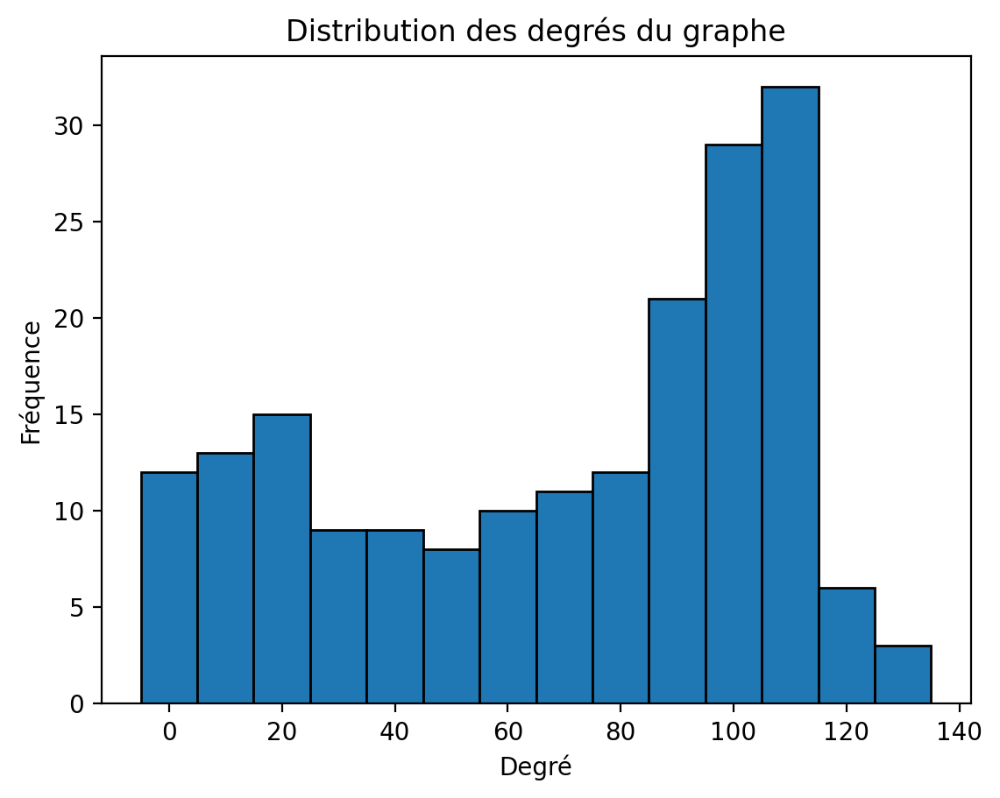

In [16]:
# courbe
degree = pd.DataFrame(graph.degree(), columns=["noeud", "degree"])
degree = degree.sort_values("degree", ascending=True)

bar = np.arange(min(degree['degree']), max(degree['degree']) + 10, 10)

# distribution des degrés - histogramme
plt.figure(dpi=200)
plt.hist(degree["degree"], bins=bar, edgecolor="black", align="left")

plt.title("Distribution des degrés du graphe")
plt.xlabel("Degré")
plt.ylabel("Fréquence")

hist = os.path.join(chemin_graph, "degree_hist.png")
plt.savefig(hist)

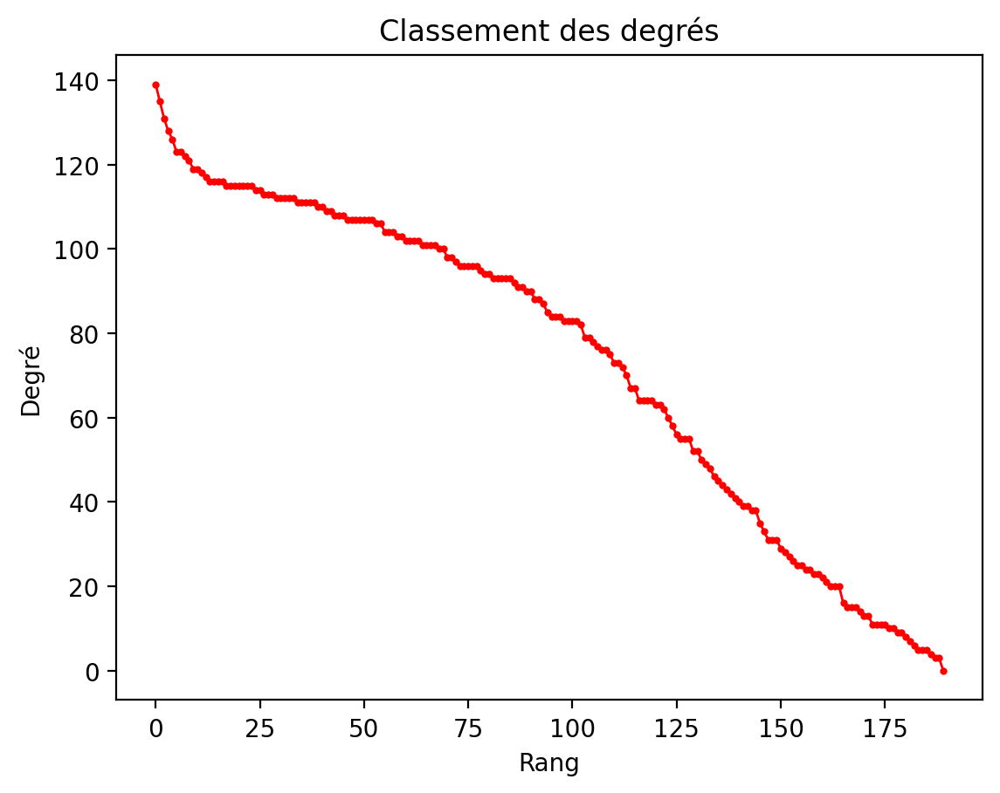

In [17]:
# courbe
degree_sequence = sorted((d for n, d in graph.degree()), reverse=True)

# distribution des degrés - courbe ligne
plt.figure(dpi=200)
plt.plot(degree_sequence, "r-", marker="o", linewidth=1, markersize=2)

plt.title("Classement des degrés")
plt.xlabel("Rang")
plt.ylabel("Degré")

ligne = os.path.join(chemin_graph, "degree_ligne.png")
plt.savefig(ligne)

In [18]:
print(degree_sequence)

[139, 135, 131, 128, 126, 123, 123, 122, 121, 119, 119, 118, 117, 116, 116, 116, 116, 115, 115, 115, 115, 115, 115, 115, 114, 114, 113, 113, 113, 112, 112, 112, 112, 112, 111, 111, 111, 111, 111, 110, 110, 109, 109, 108, 108, 108, 107, 107, 107, 107, 107, 107, 107, 106, 106, 104, 104, 104, 103, 103, 102, 102, 102, 102, 101, 101, 101, 101, 100, 100, 98, 98, 97, 96, 96, 96, 96, 96, 95, 94, 94, 93, 93, 93, 93, 93, 92, 91, 91, 90, 90, 88, 88, 87, 85, 84, 84, 84, 83, 83, 83, 83, 82, 79, 79, 78, 77, 76, 76, 75, 73, 73, 72, 70, 67, 67, 64, 64, 64, 64, 63, 63, 62, 60, 58, 56, 55, 55, 55, 52, 52, 50, 49, 48, 46, 45, 44, 43, 42, 41, 40, 39, 39, 38, 38, 35, 33, 31, 31, 31, 29, 28, 27, 26, 25, 25, 24, 24, 23, 23, 22, 21, 20, 20, 20, 16, 15, 15, 15, 14, 13, 13, 11, 11, 11, 11, 10, 10, 9, 9, 8, 7, 6, 5, 5, 5, 4, 3, 3, 0]


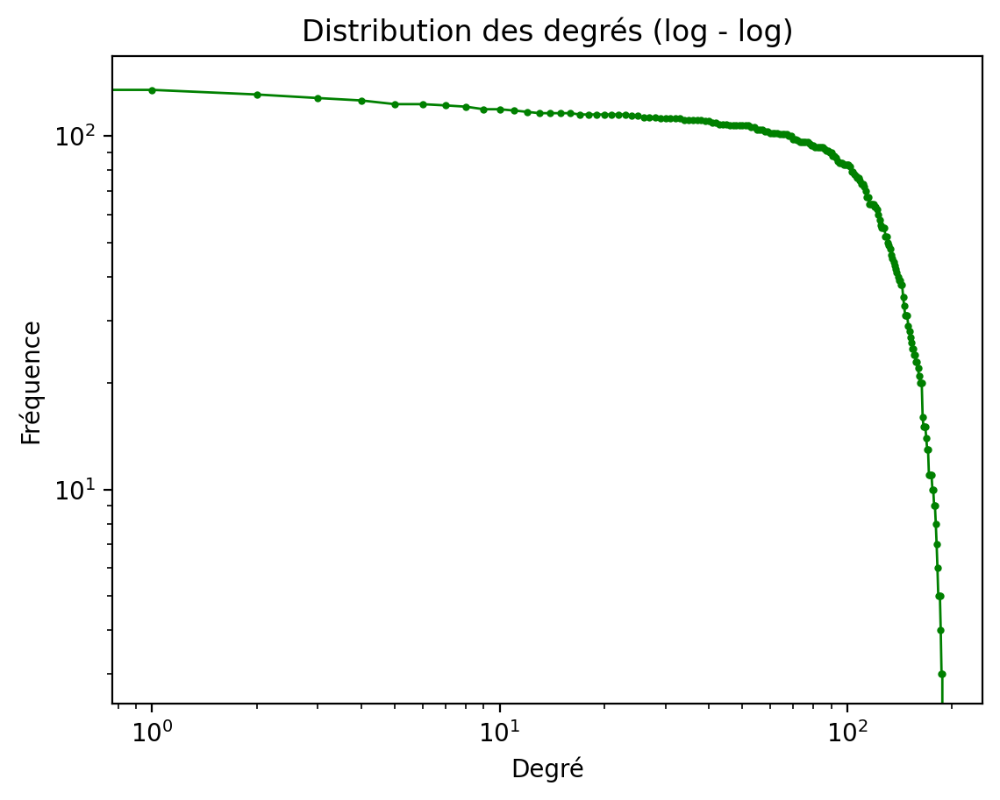

In [19]:
# courbe
degree_sequence = sorted((d for n, d in graph.degree()), reverse=True)

# distribution degré - échelle log - log
plt.figure(dpi=200)
plt.loglog(degree_sequence, "go-", linewidth=1, markersize=2)

plt.title("Distribution des degrés (log - log)")
plt.xlabel("Degré")
plt.ylabel("Fréquence")

loglog = os.path.join(chemin_graph, "log_degree.png")
plt.savefig(loglog)

### Représentation de la Force

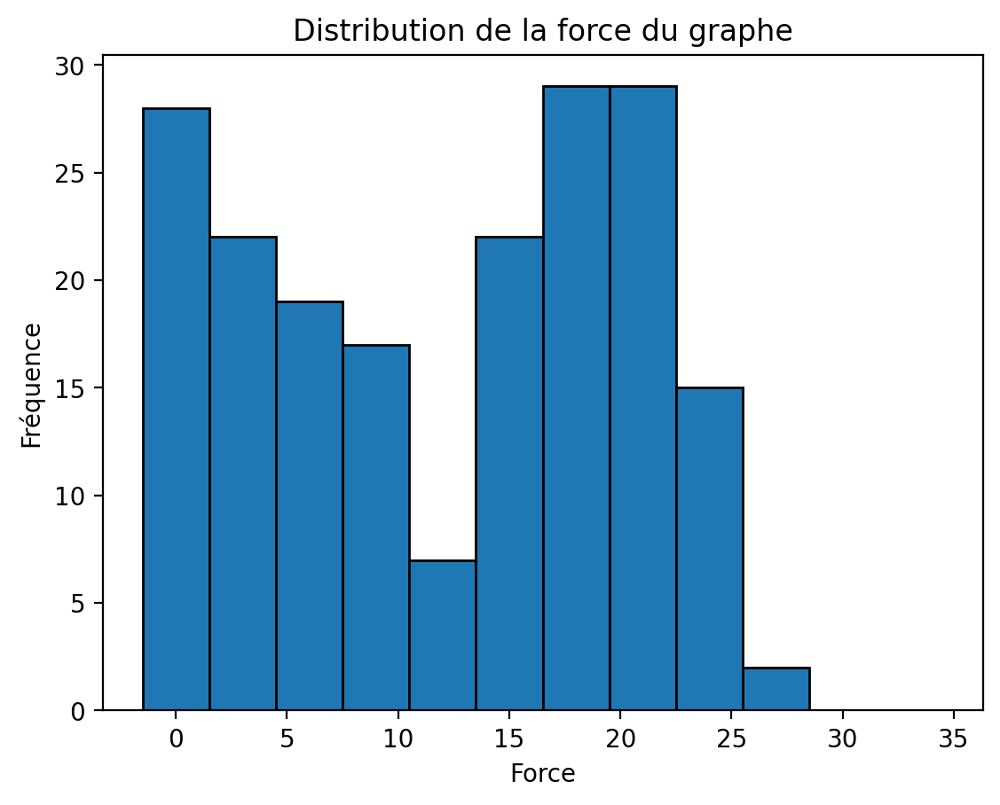

In [20]:
# courbe
strength = pd.DataFrame(graph.degree(weight='weight'), columns=["noeud", "force"])
strength = strength.sort_values("force", ascending=True)
bar = np.arange(min(strength['force']), max(strength['force']) + 10, 3)

# distribution des forces - histogramme
plt.figure(dpi=200)
plt.hist(strength["force"], bins=bar, edgecolor="black", align="left")
plt.title("Distribution de la force du graphe")
plt.xlabel("Force")
plt.ylabel("Fréquence")
hist = os.path.join(chemin_graph, "force_hist.png")
plt.savefig(hist)

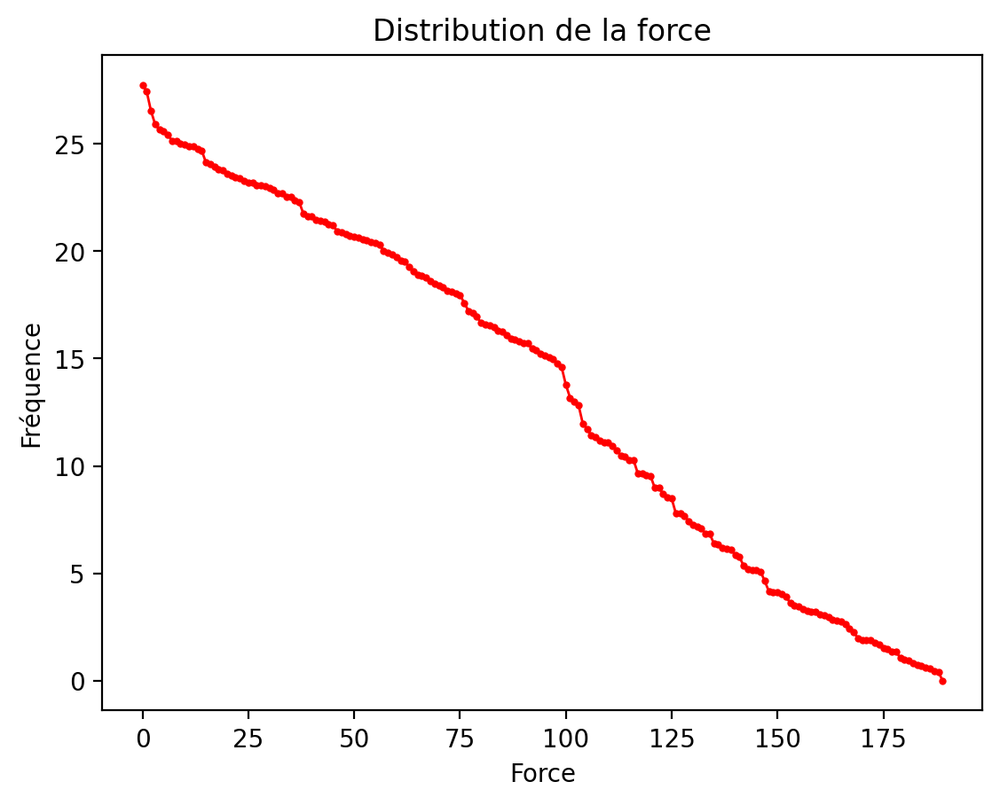

In [21]:
# courbe
strength_sequence = sorted((d for n, d in graph.degree(weight='weight')), reverse=True)

# distribution des forces - courbe ligne
plt.figure(dpi=200)
plt.plot(strength_sequence, "r-", marker="o", linewidth=1, markersize=2)
plt.title("Distribution de la force")
plt.xlabel("Force")
plt.ylabel("Fréquence")
ligne = os.path.join(chemin_graph, "force_ligne.png")
plt.savefig(ligne)

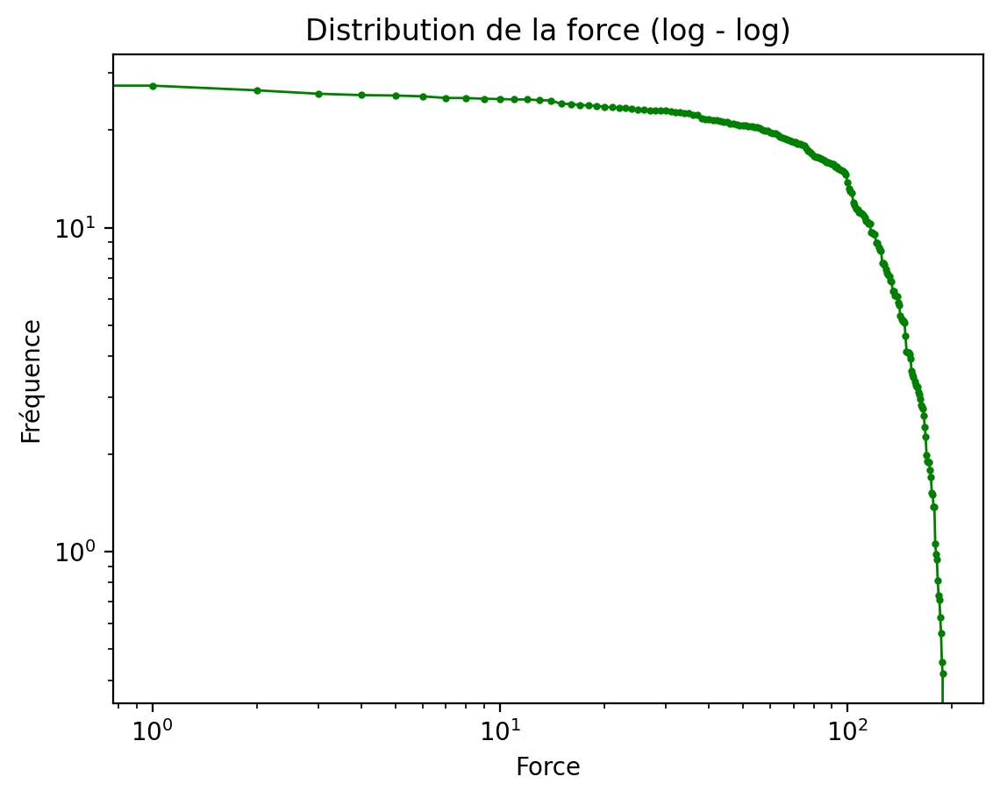

In [22]:
# courbe
strength_sequence = sorted((d for n, d in graph.degree(weight='weight')), reverse=True)

# distribution force - échelle log - log
plt.figure(dpi=200)
plt.loglog(strength_sequence, "go-", linewidth=1, markersize=2)
plt.title("Distribution de la force (log - log)")
plt.xlabel("Force")
plt.ylabel("Fréquence")
loglog = os.path.join(chemin_graph, "log_force.png")
plt.savefig(loglog)

### Centralité du réseau

Note : 
On cherche à savoir si le réseau se concentre autour de quelques noeuds (pays) ou bien s'il est plutôt dispersé.

In [23]:
# Centralité globale du réseau
degres = dict(graph.degree())

df_centralite = pd.DataFrame(
    degres.items(), 
    columns=['Noeud', 'Degres']
)

hub_max = df_centralite['Degres'].max()
somme_diff = sum(hub_max - df_centralite['Degres'])
centralisation_globale = somme_diff / ((nb_node - 1) * (nb_node - 2))
print("La centralisation du graphe : ", centralisation_globale)

La centralisation du graphe :  0.3489249127547


### Acteurs centraux et périphériques

Note : 

* La centralité de degré mesure le nombre de liens par noeud.

* La centralité de proximité (Closeness) quantifie la proximité d'un noeud par rapport à tous les autres noeuds d'un réseau

* La centralité d'intermédiarité (Betweenness) identifie les noeuds ayant un flux de communication élevé et un contrôle sur le flux d'informations.

* La centralité propre (Eigenvector) mesure calcule l'importance d'un noeud en fonction de l'importance de ses voisins

* La centralité de charge mesure la fréquence à laquelle un noeud est utilisé comme "pont" au sein de l'ensemble des chemins les plus courts du graphe.

#### Acteurs centraux

In [24]:
### Acteurs centraux ###

# Centralité de degré
centralite_degre = nx.degree_centrality(graph)
centralite_degre = sorted(centralite_degre.items(), key=lambda item: item[1], reverse=True)
print("Centralité de degré (degree) :", centralite_degre[0:5])

# Centralité de proximité (Closeness)
centralite_proximite = nx.closeness_centrality(graph)
centralite_proximite = sorted(centralite_proximite.items(), key=lambda item: item[1], reverse=True)
print("Centralité de proximité (closeness) :", centralite_proximite[0:5])

# Centralité d'intermédiarité (Betweenness)
centralite_intermediarite = nx.betweenness_centrality(graph, normalized=True)
centralite_intermediarite = sorted(centralite_intermediarite.items(), key=lambda item: item[1], reverse=True)
print("Centralité d'intermédiarité (betweenness) :", centralite_intermediarite[0:5])

# Centralité d'autonomie (Eigenvector)
centralite_autonomie = nx.eigenvector_centrality(graph, max_iter=1000)
centralite_autonomie = sorted(centralite_autonomie.items(), key=lambda item: item[1], reverse=True)
print("Centralité d'autonomie (eigenvector) :", centralite_autonomie[0:5])

# Centralité de charge 
centralite = nx.load_centrality(graph)
centralite = sorted(centralite.items(), key=lambda item: item[1], reverse=True)
print("Centralité de charge (load) :", centralite[0:5])

Centralité de degré (degree) : [('SRB', 0.7354497354497354), ('TUR', 0.7142857142857142), ('TKM', 0.693121693121693), ('PRK', 0.6772486772486772), ('NIC', 0.6666666666666666)]
Centralité de proximité (closeness) : [('SRB', 0.7664151270708647), ('TUR', 0.748021164021164), ('TKM', 0.739151347847), ('NIC', 0.7248267093228333), ('PRK', 0.7192511192511192)]
Centralité d'intermédiarité (betweenness) : [('AZE', 0.028189213011858956), ('SEN', 0.02497450483433012), ('SRB', 0.024547542168967495), ('UZB', 0.020903363850344775), ('COL', 0.019623299899153318)]
Centralité d'autonomie (eigenvector) : [('PRK', 0.10975184990449964), ('TUR', 0.10932156899218534), ('SRB', 0.10926931238086038), ('GTM', 0.10843873260815963), ('DOM', 0.10790263843636473)]
Centralité de charge (load) : [('AZE', 0.02871330334048057), ('SRB', 0.024265766606520942), ('SEN', 0.024016243493859436), ('UZB', 0.019372685578119633), ('COL', 0.017829235441146427)]


#### Exportation des données des acteurs centraux

In [25]:
df_acteur_0 = pd.DataFrame(centralite, columns= ["iso3", "Centralité de charge"])
df_acteur_1 = pd.DataFrame(centralite_degre, columns= ["iso3", "Centralité de degré (degree)"])
df_acteur_2 = pd.DataFrame(centralite_proximite, columns= ["iso3", "Centralité de proximité (closeness)"])
df_acteur_3 = pd.DataFrame(centralite_intermediarite, columns= ["iso3", "Centralité d'intermédiarité (betweenness)"])
df_acteur_4 = pd.DataFrame(centralite_autonomie, columns= ["iso3", "Centralité d'autonomie (eigenvector)"])

df_acteur_0 = df_acteur_0.sort_values(by = "Centralité de charge", ascending= False)
df_acteur_1 = df_acteur_1.sort_values(by = "Centralité de degré (degree)", ascending= False)
df_acteur_2 = df_acteur_2.sort_values(by = "Centralité de proximité (closeness)", ascending= False)
df_acteur_3 = df_acteur_3.sort_values(by = "Centralité d'intermédiarité (betweenness)", ascending= False)
df_acteur_4 = df_acteur_4.sort_values(by = "Centralité d'autonomie (eigenvector)", ascending= False)

df_acteur = df_acteur_0.merge(df_acteur_1, on="iso3").merge(df_acteur_2, on="iso3").merge(df_acteur_3, on="iso3").merge(df_acteur_4, on="iso3")

In [26]:
with pd.ExcelWriter(os.path.join(chemin_resultat, "centralites-tous-acteurs.xlsx")) as writer:
    df_acteur.to_excel(writer, sheet_name="Feuille1", index=False)
    df_acteur_0.head(5).to_excel(writer, sheet_name="Feuille2", index=False)
    df_acteur_1.head(5).to_excel(writer, sheet_name="Feuille3", index=False)
    df_acteur_2.head(5).to_excel(writer, sheet_name="Feuille4", index=False)
    df_acteur_3.head(5).to_excel(writer, sheet_name="Feuille5", index=False)
    df_acteur_4.head(5).to_excel(writer, sheet_name="Feuille6", index=False)

#### Acteurs périphériques

Pour déterminer les acteurs périphériques, nous pouvons regarder la distribution de leur degré. Les acteurs périphériques sont ceux qui ont les valeurs les plus faibles et se démarquent des autres.

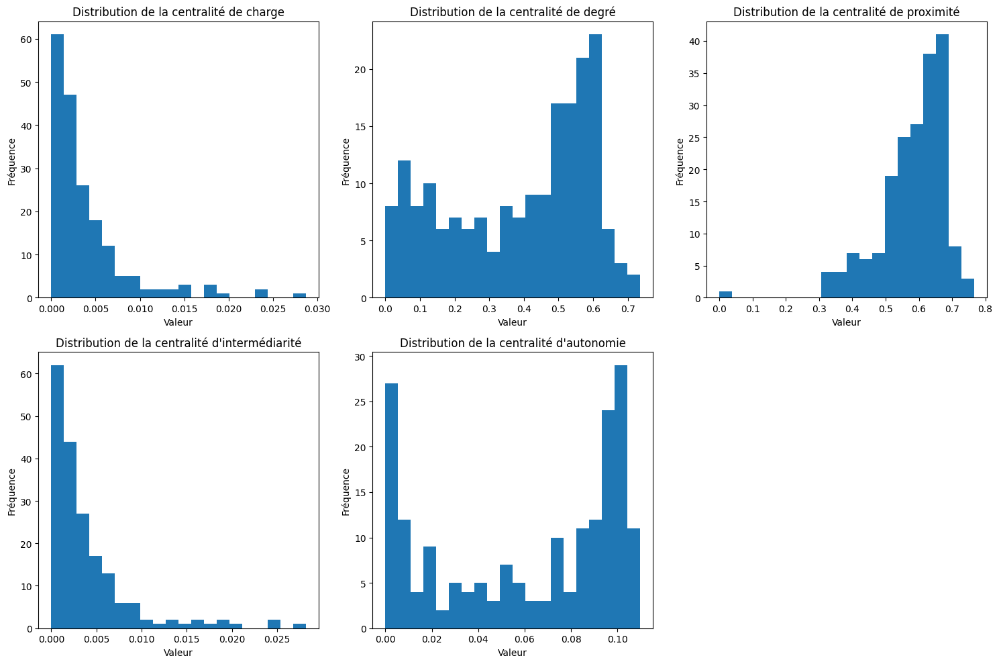

In [27]:
# Fonction pour tracer la distribution de chaque type de centralité
def tracer_distribution(centralite, titre, position):
    plt.subplot(2, 3, position)
    valeurs = [v for _, v in centralite]
    plt.hist(valeurs, bins=20)
    plt.xlabel("Valeur")
    plt.ylabel("Fréquence")
    plt.title(f"Distribution de la {titre}")

# Appels des histogrammes
plt.figure(figsize=(15, 10))
tracer_distribution(centralite, "centralité de charge", 1)
tracer_distribution(centralite_degre, "centralité de degré", 2)
tracer_distribution(centralite_proximite, "centralité de proximité", 3)
tracer_distribution(centralite_intermediarite, "centralité d'intermédiarité", 4)
tracer_distribution(centralite_autonomie, "centralité d'autonomie", 5)
plt.tight_layout()
plt.show()

In [28]:
centralite = pd.DataFrame(centralite, columns=['iso3', 'centralite'])
centralite = centralite.sort_values(by=['centralite'], ascending=True)

centralite_degre = pd.DataFrame(centralite_degre, columns=['iso3', 'centralite'])
centralite_degre = centralite_degre.sort_values(by=['centralite'], ascending=True)

centralite_proximite = pd.DataFrame(centralite_proximite, columns=['iso3', 'centralite'])
centralite_proximite = centralite_proximite.sort_values(by=['centralite'], ascending=True)

centralite_intermediarite = pd.DataFrame(centralite_intermediarite, columns=['iso3', 'centralite'])
centralite_intermediarite = centralite_intermediarite.sort_values(by=['centralite'], ascending=True)

centralite_autonomie = pd.DataFrame(centralite_autonomie, columns=['iso3', 'centralite'])
centralite_autonomie = centralite_autonomie.sort_values(by=['centralite'], ascending=True)


Les acteurs périphériques sont inférieur (strictment) à :
* centralité de charge : 0.0002
* centralité de degré (degree) : 0.03
* centralité de proximité (closeness) :  : 0.35
* centralité d'intermédiarité (betweenness) : 0.0001
* centralité d'autonomie (eigenvector) : : 0.0001  

In [29]:
### Acteurs périphériques ###
print("Acteurs périphériques")

# Centralité de charge (load centrality)
centralite = centralite.loc[centralite['centralite'] < 0.0002]
print("Centralité de charge : ", centralite)

# Centralité de degré (degree centrality)
centralite_degre = centralite_degre.loc[centralite_degre['centralite'] < 0.03]
print("Centralité de degré (degree) : ", centralite_degre)

# Centralité de proximité (closeness centrality)
centralite_proximite = centralite_proximite.loc[centralite_proximite['centralite'] < 0.35]
print("Centralité de proximité (closeness) : ", centralite_proximite)

# Centralité d'intermédiarité (betweenness centrality)
centralite_intermediarite = centralite_intermediarite.loc[centralite_intermediarite['centralite'] < 0.0001]
print("Centralité d'intermédiarité (betweenness) : ", centralite_intermediarite)

# Centralité d'autonomie (eigenvector centrality)
centralite_autonomie = centralite_autonomie.loc[centralite_autonomie['centralite'] < 0.0001]
print("Centralité d'autonomie (eigenvector) : ", centralite_autonomie)

Acteurs périphériques
Centralité de charge :      iso3  centralite
189  TGO    0.000000
188  BDI    0.000006
187  AFG    0.000006
186  JOR    0.000084
185  THA    0.000140
184  CYP    0.000182
Centralité de degré (degree) :      iso3  centralite
189  TGO    0.000000
188  BDI    0.015873
187  AFG    0.015873
186  HRV    0.021164
184  MDA    0.026455
185  SWE    0.026455
183  VGB    0.026455
Centralité de proximité (closeness) :      iso3  centralite
189  TGO    0.000000
188  BDI    0.315887
187  AFG    0.330983
186  VGB    0.339393
185  DZA    0.339393
184  GRC    0.346949
Centralité d'intermédiarité (betweenness) :      iso3  centralite
189  TGO    0.000000
188  BDI    0.000006
187  AFG    0.000006
186  JOR    0.000084
Centralité d'autonomie (eigenvector) :      iso3    centralite
189  TGO  9.556180e-24
188  BDI  1.705555e-05
187  AFG  3.012721e-05
186  DZA  7.909677e-05
185  HRV  8.795963e-05
184  GRC  9.337056e-05
183  VGB  9.429970e-05


#### Exportation des données des acteurs périphériques

In [30]:
with pd.ExcelWriter(os.path.join(chemin_resultat, "centralites-acteurs-peripheriques.xlsx")) as writer:
    df_acteur.to_excel(writer, sheet_name="Feuille1", index=False)
    centralite.to_excel(writer, sheet_name="Feuille2", index=False)
    centralite_degre.to_excel(writer, sheet_name="Feuille3", index=False)
    centralite_proximite.to_excel(writer, sheet_name="Feuille4", index=False)
    centralite_intermediarite.to_excel(writer, sheet_name="Feuille5", index=False)
    centralite_autonomie.to_excel(writer, sheet_name="Feuille6", index=False)

### Réseau "petit-monde"

In [31]:
### Création du Small-World Index (SWI) par l'approche de Neal (2017) ###

# Composante géante
largest_cc = max(nx.connected_components(graph), key=len)

G = graph.subgraph(largest_cc).copy()
# Récupérer nb noeuds
n = G.number_of_nodes()
# Récupérer densité
density = nx.density(G)
# Récupérer degrée moyen
k = int(round(sum(dict(G.degree()).values()) / n))

# Métriques du réseau réel
L = nx.average_shortest_path_length(G)
C = nx.average_clustering(G)

# Graphe aléatoire (avec les mêmes propriété que notre réseau)
G_r = nx.erdos_renyi_graph(n=n, p=density)
L_r = nx.average_shortest_path_length(G_r)
C_r = nx.average_clustering(G_r)

# Graphe lattice (graphe en forme de grille)
G_l = nx.watts_strogatz_graph(n=n, k=k, p=0)
L_l = nx.average_shortest_path_length(G_l)
C_l = nx.average_clustering(G_l)

# Small World Index (formule)
SWI = ((L - L_l) / (L_r - L_l)) * ((C - C_r) / (C_l - C_r))
print("Small-World Index (Neal (2017) :", SWI)

print("Coefficient de clustering :", C)
print("Distance moyenne entre nos noeuds :", L)

Small-World Index (Neal (2017) : 0.2698591183840256
Coefficient de clustering : 0.6883863037225677
Distance moyenne entre nos noeuds : 1.750028143645165


### Comparative du réseau 10 ans auparavant

### <center> 1998

### Création du Réseau (1998)

In [32]:
graph_1998 = nx.from_pandas_adjacency(df_1)

### Représentation visuelle du réseau Monde (1998)

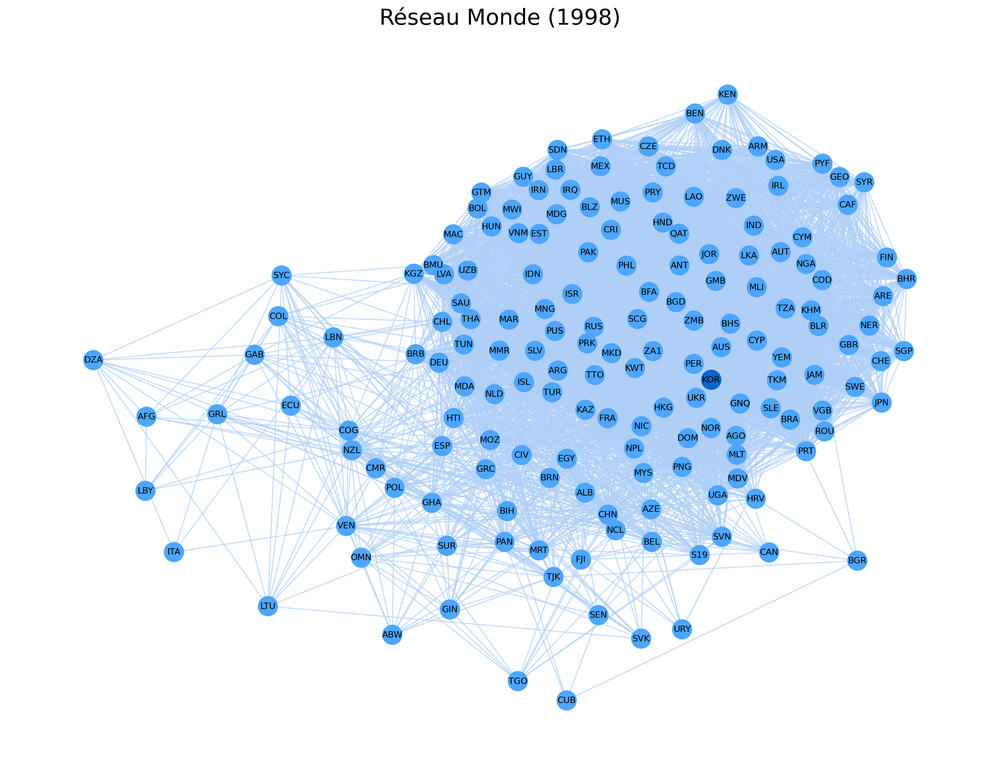

In [33]:
plt.figure(figsize=(16, 12), dpi=200)

node_colors = ["#0666CC" if node == "KOR" else "#4DA6FF" for node in graph_1998.nodes()]

pos = nx.kamada_kawai_layout(graph_1998)

nx.draw_networkx_edges(graph_1998, pos, alpha=0.7, edge_color="#AFCFF7")
nx.draw_networkx_nodes(graph_1998, pos, node_color=node_colors, node_size=300)
nx.draw_networkx_labels(graph_1998, pos, font_size=8)

plt.title("Réseau Monde (1998)", fontsize=20)
plt.axis("off")

reseau_monde = os.path.join(chemin_graph, "reseau_monde_1998_non_pondere.png")
plt.savefig(reseau_monde)

plt.show()

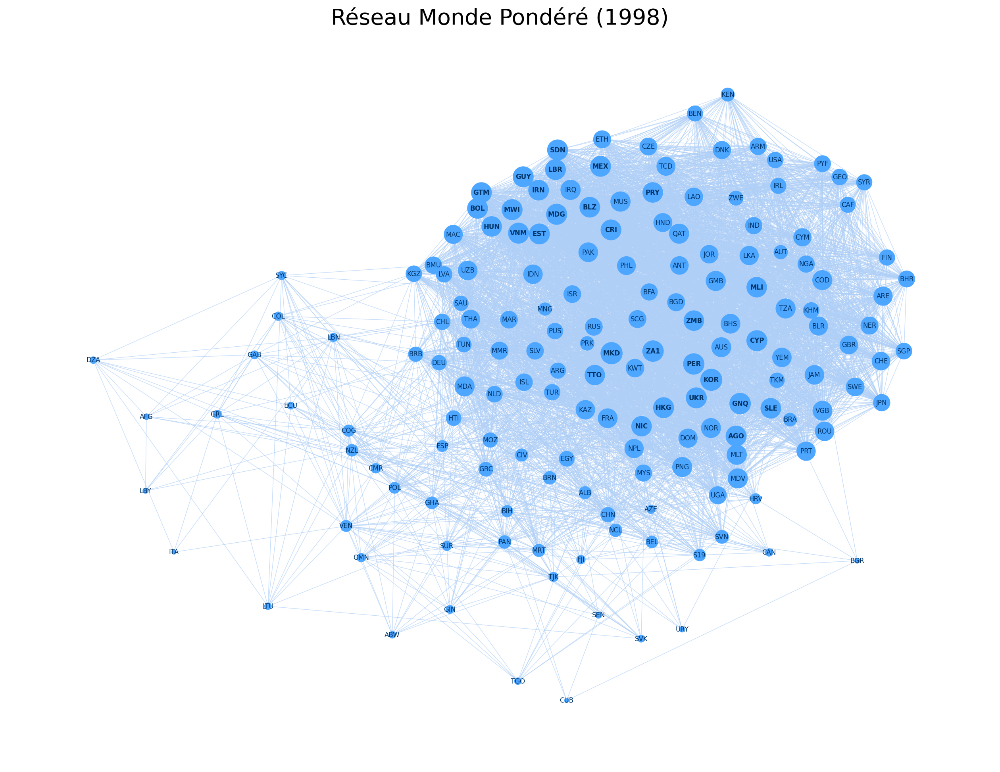

In [34]:
plt.figure(figsize=(16, 12), dpi= 200)
pos = nx.kamada_kawai_layout(graph_1998)
d = dict(graph_1998.degree)
node_sizes = [v * 3 for v in d.values()]
nx.draw_networkx_nodes(graph_1998, pos, 
                       node_size=node_sizes, 
                       node_color="#4DA6FF", 
                       linewidths=1)
for node, degree in d.items():
    taille = degree * 0.05 
    taille_finale = max(taille, 6) 
    nx.draw_networkx_labels(graph_1998, pos, 
                            labels={node: node}, 
                            font_size=taille_finale,
                            font_color='#003366',
                            font_weight='bold' if degree > 100 else 'normal')
nx.draw_networkx_edges(graph_1998, pos, 
                       edge_color="#AFCFF7", 
                       alpha=0.7,
                       width=0.5)

plt.title("Réseau Monde Pondéré (1998)", fontsize=20)
plt.axis('off')

reseau_monde = os.path.join(chemin_graph, "reseau_monde_1998.png")
plt.savefig(reseau_monde)

plt.show()

### Inférence statistique (comparer deux réseaux ensemble, est-ce qu'il existe une permanace du réseau dans le temps ?)

### Multiple Regression Quadratic Assignment Procedure (MRQAP)

#### Approche manuelle avec permutations

In [35]:
# Pour le modèle MRQAP, besoin d'avoir les mêmes noeuds dans les 2 graphes
# Création des graphes
graph_2008 = nx.from_pandas_adjacency(df)   # Graphe 2008
graph_1998 = nx.from_pandas_adjacency(df_1) # Graphe 1998

# Trouver les noeuds communs
common_nodes = df.index.intersection(df_1.index) # Intersection des deux index

# Sélectionner uniquement les lignes et colonnes correspondantes
A = df.loc[common_nodes, common_nodes].to_numpy()   # Matrice 2008
B = df_1.loc[common_nodes, common_nodes].to_numpy() # Matrice 1998
print(f"Dimensions des matrices alignées : {A.shape}")

# Liste complète des noeuds (union des deux graphes)
all_countries = sorted(list(set(graph_1998.nodes()) | set(graph_2008.nodes())))

# Ajout des noeuds manquants avec poids 0
graph_1998.add_nodes_from(all_countries)
graph_2008.add_nodes_from(all_countries)

# Matrices d'adjacence alignées
matrice_1998 = nx.to_numpy_array(graph_1998, nodelist=all_countries, weight='weight').flatten()
matrice_2008 = nx.to_numpy_array(graph_2008, nodelist=all_countries, weight='weight').flatten()

Dimensions des matrices alignées : (163, 163)


In [36]:
# Calcul de la corrélation
corr_matrix = np.corrcoef(matrice_1998, matrice_2008)[0, 1]
print(f"Résultat Corrélation : {corr_matrix:.4f}")

Résultat Corrélation : 0.0761


Note :

Les graphes comparés doivent avoir la même dimension, i.e. les mêmes noeuds

La corrélation indique à quel point les réseaux ont des structures similaires

#### Création du modèle MRQAP

In [37]:
# Vectorisation hors-diagonale
def vectorize(matrix):
    return matrix[np.triu_indices_from(matrix, k=1)]

y_vec = vectorize(A)  # dépendante
X_vec = vectorize(B)  # indépendante
X_vec = X_vec.reshape(-1, 1)  # reshaper en matrice n_samples x n_features

# Ajouter une constante pour l'intercept
X_vec_const = sm.add_constant(X_vec)

# Régression OLS
model = sm.OLS(y_vec, X_vec_const).fit()
print(model.summary())

# Test de permutation
n_permutations = 1000
coefs_perm = np.zeros(n_permutations)

for i in range(n_permutations):
    perm = np.random.permutation(A.shape[0])
    A_perm = A[perm, :][:, perm]
    y_perm_vec = vectorize(A_perm)
    model_perm = sm.OLS(y_perm_vec, X_vec_const).fit()
    coefs_perm[i] = model_perm.params[1]  # coefficient pour B

# P-value empirique
coef_obs = model.params[1]
p_value = (np.abs(coefs_perm) >= np.abs(coef_obs)).mean()

print("Coefficient observé:", coef_obs)
print("P-value MRQAP:", p_value)

with open(os.path.join(chemin_resultat, "mrqap-manuel.txt"), "w") as f:
    f.write(model.summary().as_text())
    f.write(f"\n\nCoefficient observé : {coef_obs}\n")
    f.write(f"P-value MRQAP (permutations) : {p_value}\n")

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     119.3
Date:                Thu, 10 Sep 2026   Prob (F-statistic):           1.19e-27
Time:                        20:47:19   Log-Likelihood:                 11725.
No. Observations:               13203   AIC:                        -2.345e+04
Df Residuals:                   13201   BIC:                        -2.343e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0654      0.001     61.018      0.0

#### Approche avec bibliothèque (github)

In [38]:
# Création des graphes
graph_2008 = nx.from_pandas_adjacency(df)
graph_1998 = nx.from_pandas_adjacency(df_1)

# Trouver les noeuds communs
common_nodes = df.index.intersection(df_1.index)

# Sélectionner uniquement les lignes et colonnes correspondantes
A = df.loc[common_nodes, common_nodes].to_numpy()  # Matrice 2008
B = df_1.loc[common_nodes, common_nodes].to_numpy()  # Matrice 1998

print(f"Dimensions des matrices alignées : {A.shape}")

Dimensions des matrices alignées : (163, 163)



=== Summary OLS (original) ===
                            OLS Regression Results                            
Dep. Variable:            Reseau_2008   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     238.6
Date:                Thu, 10 Sep 2026   Prob (F-statistic):           1.38e-53
Time:                        20:47:23   Log-Likelihood:                 23450.
No. Observations:               26406   AIC:                        -4.690e+04
Df Residuals:                   26404   BIC:                        -4.688e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.

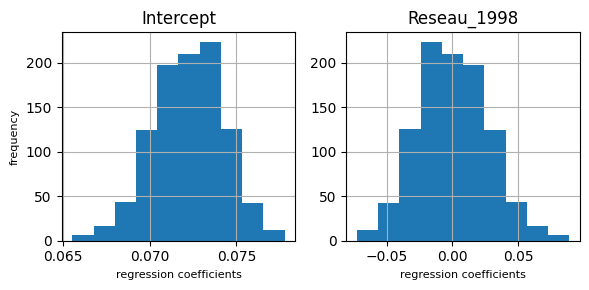

In [39]:
Y = {'Reseau_2008': A}
X = {'Reseau_1998': B}

# Modèle MRQAP
mrqap = MRQAP(Y=Y, X=X, npermutations=1000, diagonal=False, directed=True)
mrqap.mrqap()
mrqap.summary()
mrqap.plot('betas')

In [40]:
import io
from contextlib import redirect_stdout

# Capturer le summary
buffer = io.StringIO()
with redirect_stdout(buffer):
    mrqap.summary()
summary_text = buffer.getvalue()

# Sauvegarder en verbatim LaTeX
with open(os.path.join(chemin_resultat, "mrqap-bibliotheque.tex"), "w") as f:
    f.write("\\begin{verbatim}\n")
    f.write(summary_text)
    f.write("\\end{verbatim}")

Le coefficient de x1 (0,091) indique qu’une augmentation d’une unité de x1 entraîne en moyenne une hausse de 0,091 de y, et ce lien est statistiquement significatif (p < 0,01). Cependant, le R² très faible (0,009) montre que x1 explique moins de 1 % de la variance de y, donc la plupart de la variation de y reste inexpliquée par ce modèle. En résumé, x1 a un effet réel mais limité sur y.

### Robustesse du réseau

On cherche à évaluer à quel point il est facile ou difficile de déconnecter les acteurs entre eux.

Pour cela, on s'appuire sur la valeur de Fiedler, elle quantifie à quel point un réseau est difficile à déconnecter.
Il s'agit de la deuxième plus petite valeur propre de la matrice Laplacienne d'un graphe. 

#### Valeur de Fiedler (λ2)

In [41]:
# Recréer le graphe 
graph_2008 = nx.from_pandas_adjacency(df)

# Matrice laplacienne
L = nx.laplacian_matrix(graph_2008, weight="weight")
L = L.todense()   # pour avoir une matrice NumPy lisible

degree_weighted = dict(graph_2008.degree(weight="weight"))
#print(degree_weighted)

A = nx.adjacency_matrix(graph_2008, weight="weight").todense()
#print(A)

D = np.diag([degree_weighted[n] for n in graph_2008.nodes()])
#print(D)

L = D - A

eigvals = np.linalg.eigvals(L)
eigvals = np.sort(np.real(eigvals)) # important pour avoir la deuxième valeur la plus petite

print(eigvals[:5])
print("λ2 =", eigvals[1])

[0.00000000e+00 1.81594062e-15 2.59380923e-01 3.69367798e-01
 4.11150779e-01]
λ2 = 1.815940623681188e-15


In [42]:
# Valeur de Fiedler (algebraic connectivity)
# Seconde valeur de la matrice laplacienne
fiedler_value = nx.algebraic_connectivity(graph_2008, weight="weight")

print("Fiedler value (λ2) :", fiedler_value)

Fiedler value (λ2) : 0.0


In [43]:
# Recréer le graphe 
graph_2008 = nx.from_pandas_adjacency(df)
largest_cc = max(nx.connected_components(graph_2008), key=len)
G = graph.subgraph(largest_cc).copy()

# Matrice laplacienne
L = nx.laplacian_matrix(G, weight="weight")
L = L.todense()   # pour avoir une matrice NumPy lisible

degree_weighted = dict(G.degree(weight="weight"))
#print(degree_weighted)

A = nx.adjacency_matrix(G, weight="weight").todense()
#print(A)

D = np.diag([degree_weighted[n] for n in G.nodes()])
#print(D)

L = D - A

eigvals = np.linalg.eigvals(L)
eigvals = np.sort(np.real(eigvals)) # important pour avoir la deuxième valeur la plus petite

print(eigvals[:5])
print("λ2 =", eigvals[1])

[-1.13979539e-16  2.59380923e-01  3.69367798e-01  4.11150779e-01
  4.65084328e-01]
λ2 = 0.25938092274602703


In [44]:
# Valeur de Fiedler (algebraic connectivity)
# Seconde valeur de la matrice laplacienne
fiedler_value = nx.algebraic_connectivity(G, weight="weight")

print("Fiedler value (λ2) :", fiedler_value)

Fiedler value (λ2) : 0.2593809227461572


#### Conclusion du réseau : Arbre Couvrant Minimal

Il s'agit des liens minimaux et indispensables pour maintenir le réseau connecté

In [45]:
mst = nx.minimum_spanning_tree(graph_2008)

print("Arêtes du MST :", mst.edges(data=True))
print("Poids total du MST :", mst.size(weight='weight'))

Arêtes du MST : [('AFG', 'TZA', {'weight': 0.10714286}), ('ALB', 'SDN', {'weight': 0.10055866}), ('ALB', 'NIC', {'weight': 0.10084034}), ('ALB', 'NER', {'weight': 0.10148515}), ('ALB', 'BLR', {'weight': 0.10204082}), ('ALB', 'THA', {'weight': 0.10204082}), ('ALB', 'S19', {'weight': 0.10215054}), ('ALB', 'MKD', {'weight': 0.10403397}), ('DZA', 'MEX', {'weight': 0.11111111}), ('AND', 'BIH', {'weight': 0.10313901}), ('AGO', 'NGA', {'weight': 0.10106383}), ('ATG', 'CHN', {'weight': 0.1025641}), ('ATG', 'GHA', {'weight': 0.10526316}), ('ATG', 'MEX', {'weight': 0.10526316}), ('AZE', 'ZAF', {'weight': 0.10227273}), ('AZE', 'LAO', {'weight': 0.10526316}), ('ARG', 'LKA', {'weight': 0.10358566}), ('AUS', 'GAB', {'weight': 0.10204082}), ('AUT', 'CYM', {'weight': 0.1010101}), ('AUT', 'HND', {'weight': 0.10135135}), ('AUT', 'ZMB', {'weight': 0.10169491}), ('AUT', 'EST', {'weight': 0.10185185}), ('AUT', 'ESP', {'weight': 0.10197368}), ('AUT', 'ZAF', {'weight': 0.10227273}), ('BHS', 'ISL', {'weight':

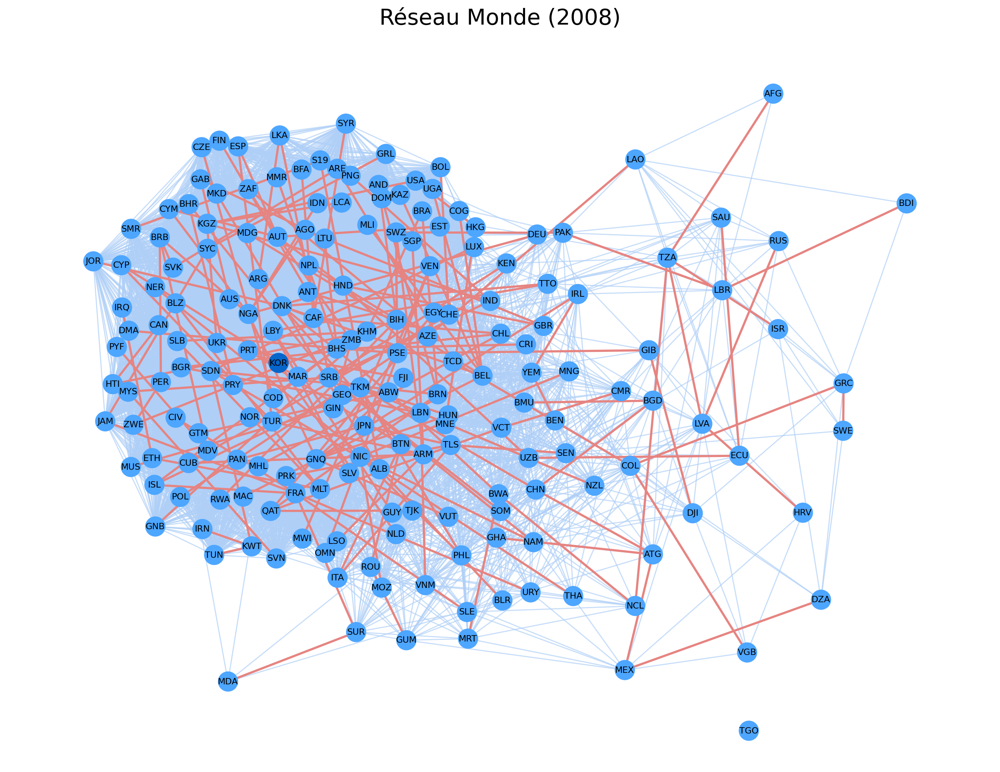

In [46]:
plt.figure(figsize=(16, 12), dpi=200)

node_colors = ["#0666CC" if node == "KOR" else "#4DA6FF" for node in graph.nodes()]

pos = nx.kamada_kawai_layout(graph)
pos["TGO"] = (0.3, -0.3)

nx.draw_networkx_edges(graph, pos, alpha=0.7, edge_color="#AFCFF7")
nx.draw_networkx_edges(mst, pos, edge_color="#e68481", width=2)
nx.draw_networkx_nodes(graph, pos, node_color=node_colors, node_size=300)
nx.draw_networkx_labels(graph, pos, font_size=8)

plt.title("Réseau Monde (2008)", fontsize=20)
plt.axis("off")

reseau_monde = os.path.join(chemin_graph, "reseau_monde_2008_mst_overlay.png")
plt.savefig(reseau_monde)

plt.show()

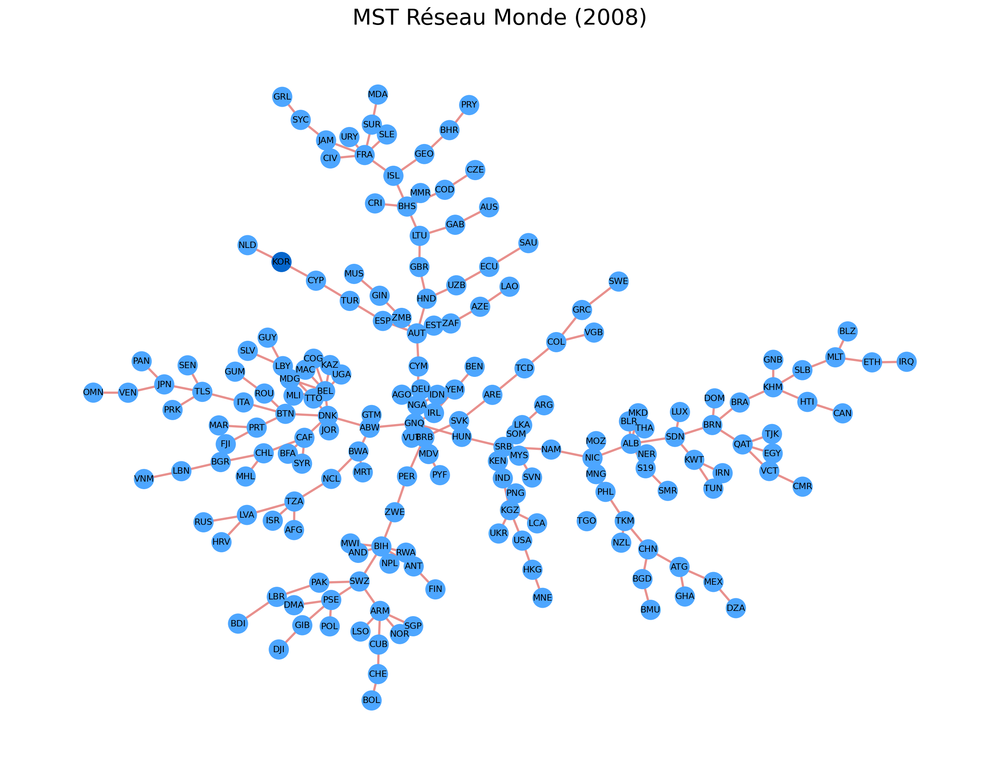

In [47]:
plt.figure(figsize=(16, 12), dpi=200)

node_colors = ["#0666CC" if node == "KOR" else "#4DA6FF" for node in mst.nodes()]

pos = nx.kamada_kawai_layout(mst)  # layout basé sur le MST
pos["TGO"] = (0.3, -0.3)

# On dessine uniquement les arêtes du MST
nx.draw_networkx_edges(mst, pos, edge_color="#e68481", width=2, alpha=0.9)

# Nœuds et labels du MST
nx.draw_networkx_nodes(mst, pos, node_color=node_colors, node_size=300)
nx.draw_networkx_labels(mst, pos, font_size=8)

plt.title("MST Réseau Monde (2008)", fontsize=20)
plt.axis("off")

reseau_monde = os.path.join(chemin_graph, "spanning_tree.png")
plt.savefig(reseau_monde)
plt.show()

## II - Analyse de la position du pays (Corée) 

### Représentation visuelle du réseau de la Corée

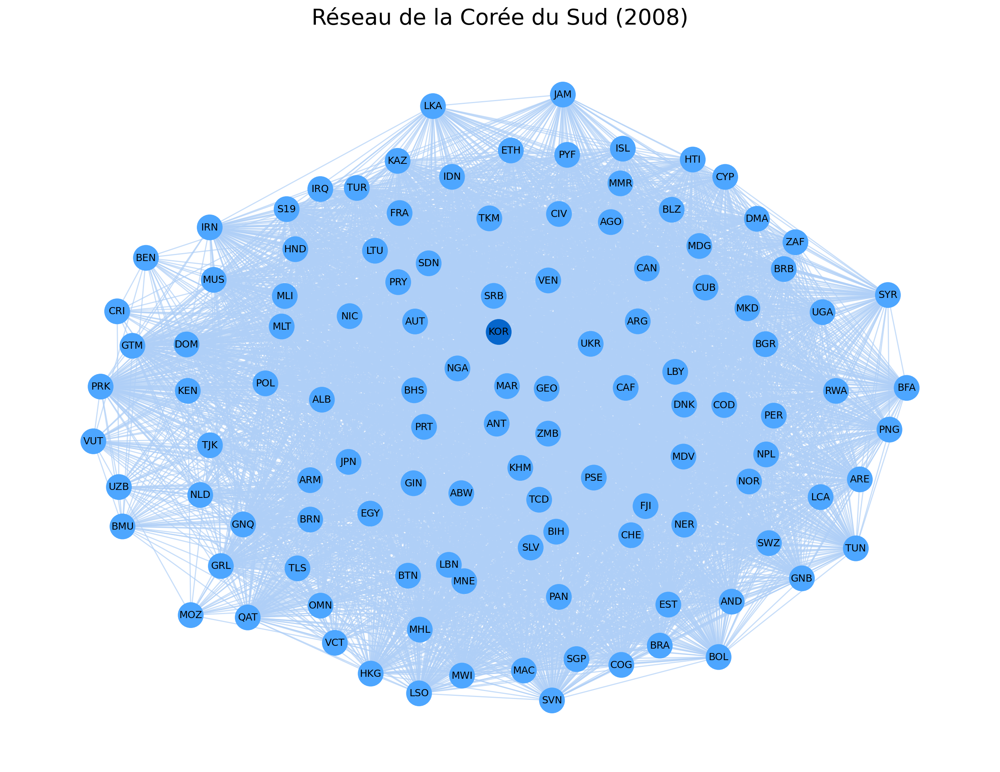

In [48]:
# Focus sur la Corée (KOR) et ses voisins directs/indirects
ego_kor = nx.ego_graph(graph, "KOR")

# Représentation du réseau
plt.figure(figsize=(16, 12), dpi=200)

node_colors = ["#0666CC" if node == "KOR" else "#4DA6FF" for node in ego_kor.nodes()]

pos = nx.kamada_kawai_layout(ego_kor)
nx.draw_networkx_edges(ego_kor, pos, alpha=0.7, edge_color="#AFCFF7")
nx.draw_networkx_nodes(ego_kor, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_labels(ego_kor, pos, font_size=9)

plt.title("Réseau de la Corée du Sud (2008)", fontsize=20)
plt.axis("off")

reseau_coree = os.path.join(chemin_graph, "reseau_coree_2008.png")
plt.savefig(reseau_coree)

plt.show()

### La Corée est-elle un acteur central du réseau ? 

In [49]:
# Centralité de charge (load centrality)
centralite_load = nx.load_centrality(graph)

# Pays le plus central
first_load = max(centralite_load.items(), key=lambda x: x[1])

# Valeur pour la Corée
korea_load = centralite_load.get("KOR", None)

print("Centralité de charge :")
print(" - Premier pays :", first_load)
print(" - Corée (KOR)   :", korea_load)
print("\n")

# Centralité de degré
centralite_degre = nx.degree_centrality(graph)
first_deg = max(centralite_degre.items(), key=lambda x: x[1])
korea_deg = centralite_degre.get("KOR", None)

print("Centralité de degré :")
print(" - Premier pays :", first_deg)
print(" - Corée (KOR)   :", korea_deg)
print("\n")

# Centralité de proximité
centralite_proximite = nx.closeness_centrality(graph)
first_close = max(centralite_proximite.items(), key=lambda x: x[1])
korea_close = centralite_proximite.get("KOR", None)

print("Centralité de proximité :")
print(" - Premier pays :", first_close)
print(" - Corée (KOR)   :", korea_close)
print("\n")

# Centralité d'intermédiarité
centralite_inter = nx.betweenness_centrality(graph, normalized=True)
first_inter = max(centralite_inter.items(), key=lambda x: x[1])
korea_inter = centralite_inter.get("KOR", None)

print("Centralité d'intermédiarité :")
print(" - Premier pays :", first_inter)
print(" - Corée (KOR)   :", korea_inter)
print("\n")

# Centralité d'autonomie (eigenvector)
centralite_eig = nx.eigenvector_centrality(graph, max_iter=1000)
first_eig = max(centralite_eig.items(), key=lambda x: x[1])
korea_eig = centralite_eig.get("KOR", None)

print("Centralité d'autonomie :")
print(" - Premier pays :", first_eig)
print(" - Corée (KOR)   :", korea_eig)
print("\n")

Centralité de charge :
 - Premier pays : ('AZE', 0.02871330334048057)
 - Corée (KOR)   : 0.0047991197869195765


Centralité de degré :
 - Premier pays : ('SRB', 0.7354497354497354)
 - Corée (KOR)   : 0.6084656084656084


Centralité de proximité :
 - Premier pays : ('SRB', 0.7664151270708647)
 - Corée (KOR)   : 0.6850010659534469


Centralité d'intermédiarité :
 - Premier pays : ('AZE', 0.028189213011858956)
 - Corée (KOR)   : 0.004868557249093728


Centralité d'autonomie :
 - Premier pays : ('PRK', 0.10975184990449964)
 - Corée (KOR)   : 0.09847601921228717




In [50]:
### Classement du noeud KOR ###

# Préparation des données
df = pd.DataFrame({
    "Degré": centralite_degre,
    "Intermédiarité": centralite_inter,
    "Proximité": centralite_proximite,
    "Charge": centralite_load,
    "Vecteur_Propre": centralite_eig,
})

# Calcul des percentiles
df_top_percent = (1 - df.rank(pct=True)) * 100
kor_stats = df_top_percent.loc["KOR"]

# Afficher le rang
for centralite, valeur in kor_stats.items():
    print(f"{centralite} : Top {valeur} %")

Degré : Top 10.526315789473683 %
Intermédiarité : Top 26.315789473684216 %
Proximité : Top 7.36842105263158 %
Charge : Top 25.789473684210527 %
Vecteur_Propre : Top 21.578947368421055 %


### Voisin de la corée

In [51]:
atlas = graph.adj["KOR"]
print(type(atlas))
print(list(atlas.keys()))
print(list(atlas.values()))
print(list(atlas.items()))
print(sorted(atlas.items(), key=lambda iso3: iso3[1]['weight'], reverse=True))

<class 'networkx.classes.coreviews.AtlasView'>
['ALB', 'AND', 'AGO', 'ARG', 'AUT', 'BHS', 'ARM', 'BRB', 'BMU', 'BTN', 'BOL', 'BIH', 'BRA', 'BLZ', 'BRN', 'BGR', 'MMR', 'KHM', 'CAN', 'CAF', 'LKA', 'TCD', 'COG', 'COD', 'CRI', 'CUB', 'CYP', 'BEN', 'DNK', 'DMA', 'DOM', 'SLV', 'GNQ', 'ETH', 'EST', 'FJI', 'FRA', 'PYF', 'GEO', 'PSE', 'GRL', 'GTM', 'GIN', 'HTI', 'HND', 'HKG', 'ISL', 'IDN', 'IRN', 'IRQ', 'CIV', 'JAM', 'JPN', 'KAZ', 'KEN', 'PRK', 'LBN', 'LSO', 'LBY', 'LTU', 'MAC', 'MDG', 'MWI', 'MDV', 'MLI', 'MLT', 'MUS', 'S19', 'MNE', 'MAR', 'MOZ', 'OMN', 'NPL', 'NLD', 'ANT', 'ABW', 'VUT', 'NIC', 'NER', 'NGA', 'NOR', 'MHL', 'PAN', 'PNG', 'PRY', 'PER', 'POL', 'PRT', 'GNB', 'TLS', 'QAT', 'RWA', 'LCA', 'VCT', 'SRB', 'SGP', 'SVN', 'ZAF', 'SDN', 'SWZ', 'CHE', 'SYR', 'TJK', 'ARE', 'TUN', 'TUR', 'TKM', 'UGA', 'UKR', 'MKD', 'EGY', 'BFA', 'UZB', 'VEN', 'ZMB']
[{'weight': 0.1971831}, {'weight': 0.14798206}, {'weight': 0.11702128}, {'weight': 0.19402985}, {'weight': 0.11267605}, {'weight': 0.25324675}, {'w

In [52]:
neighbors = graph["KOR"]

# top 15
top15 = sorted(neighbors.items(), key=lambda x: x[1]["weight"], reverse=True)[:15]

for country, attrs in top15:
    print(f"{country} : {attrs['weight']}")

df_top15 = pd.DataFrame(
    [{"ISO3": country, "weight": attrs["weight"]} for country, attrs in top15]
)
df_top15.to_excel(os.path.join(chemin_resultat, "korea-voisins-top15.xlsx"), index=False)

S19 : 0.27956989
BHS : 0.25324675
MLI : 0.25268817
SWZ : 0.25242719
MHL : 0.25221238
TKM : 0.24683544
MAC : 0.24427481
SRB : 0.23489933
GTM : 0.23394495
FJI : 0.23239437
GEO : 0.23239437
UKR : 0.23125
FRA : 0.22535211
NIC : 0.22535211
EGY : 0.22535211


On regarde les 15 premiers voisins de la Corée pour determiner le top le plus pertinent 

### A quel cluster la Corée du Sud appartient-elle ?

In [53]:
partition = louvain.best_partition(graph, random_state=42)

print(partition)
print(type(partition))

partition = (pd.DataFrame.from_dict(partition, orient="index", columns=["community"]).reset_index().rename(columns={"index": "iso3"}))
partition = partition.sort_values("community").reset_index(drop=True)

df_partition = pd.DataFrame.from_dict(partition)
df_partition.to_excel(os.path.join(chemin_resultat, "louvain-clusters.xlsx"), index=False)

{'AFG': 0, 'ALB': 0, 'DZA': 0, 'AND': 2, 'AGO': 3, 'ATG': 0, 'AZE': 0, 'ARG': 3, 'AUS': 2, 'AUT': 3, 'BHS': 0, 'BHR': 3, 'BGD': 0, 'ARM': 0, 'BRB': 3, 'BEL': 0, 'BMU': 0, 'BTN': 2, 'BOL': 3, 'BIH': 0, 'BWA': 0, 'BRA': 3, 'BLZ': 3, 'SLB': 3, 'VGB': 0, 'BRN': 0, 'BGR': 3, 'MMR': 3, 'BDI': 0, 'BLR': 0, 'KHM': 2, 'CMR': 0, 'CAN': 3, 'CYM': 3, 'CAF': 0, 'LKA': 3, 'TCD': 0, 'CHL': 0, 'CHN': 0, 'COL': 0, 'COG': 2, 'COD': 2, 'CRI': 0, 'HRV': 0, 'CUB': 3, 'CYP': 3, 'CZE': 3, 'BEN': 0, 'DNK': 2, 'DMA': 3, 'DOM': 2, 'ECU': 0, 'SLV': 0, 'GNQ': 3, 'ETH': 3, 'EST': 3, 'FJI': 0, 'FIN': 3, 'FRA': 2, 'PYF': 3, 'DJI': 0, 'GAB': 3, 'GEO': 0, 'PSE': 0, 'DEU': 0, 'GHA': 0, 'GIB': 0, 'GRC': 0, 'GRL': 3, 'GUM': 0, 'GTM': 2, 'GIN': 2, 'GUY': 0, 'HTI': 2, 'HND': 2, 'HKG': 3, 'HUN': 2, 'ISL': 3, 'IDN': 2, 'IRN': 3, 'IRQ': 3, 'IRL': 0, 'ISR': 0, 'ITA': 0, 'CIV': 3, 'JAM': 3, 'JPN': 0, 'KAZ': 2, 'JOR': 3, 'KEN': 0, 'PRK': 2, 'KOR': 0, 'KWT': 2, 'KGZ': 3, 'LAO': 0, 'LBN': 0, 'LSO': 3, 'LVA': 0, 'LBR': 0, 'LBY': 2,

In [54]:
# Trouver la communauté du noeud "KOR"
kor_community = partition[partition['iso3'] == 'KOR']['community'].values[0]

# Créer un tableau avec tous les pays du même cluster que KOR
kor_cluster = partition[partition['community'] == kor_community]

print(f"KOR appartient à la communauté : {kor_community}")
print(f"\nPays dans le même cluster que KOR :")
print(kor_cluster)
print(len(kor_cluster))

KOR appartient à la communauté : 0

Pays dans le même cluster que KOR :
   iso3  community
0   AFG          0
1   ABW          0
2   NLD          0
3   NAM          0
4   OMN          0
..  ...        ...
86  BEN          0
87  ZMB          0
88  ECU          0
89  SLV          0
90  FJI          0

[91 rows x 2 columns]
91


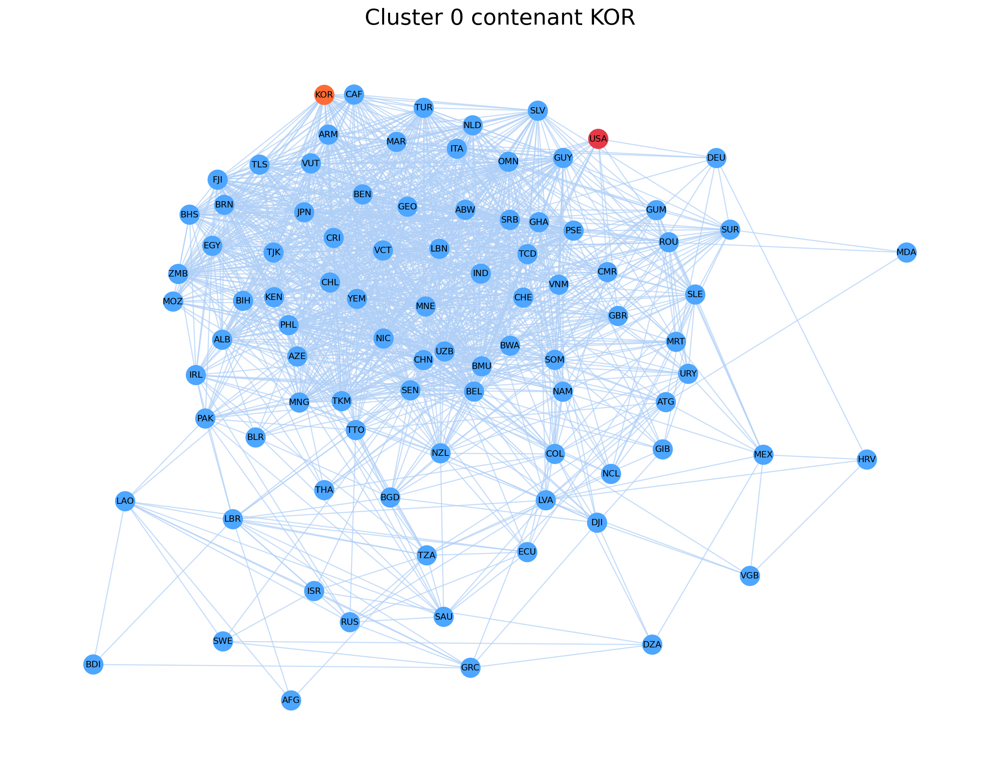

In [55]:
# Visualisation du cluster
kor_cluster_nodes = kor_cluster['iso3'].tolist()
subgraph = graph.subgraph(kor_cluster_nodes)

plt.figure(figsize=(16, 12), dpi=200)
node_colors = ["#FF6B35" if node == "KOR" else "#E63946" if node == "USA" else "#4DA6FF" for node in subgraph.nodes()]
pos = nx.kamada_kawai_layout(subgraph)
nx.draw_networkx_edges(subgraph, pos, alpha=0.7, edge_color="#AFCFF7")
nx.draw_networkx_nodes(subgraph, pos, node_color=node_colors, node_size=300)
nx.draw_networkx_labels(subgraph, pos, font_size=8)
plt.title(f"Cluster {kor_community} contenant KOR", fontsize=20)
plt.axis("off")
cluster_kor = os.path.join(chemin_graph, "cluster_kor.png")
plt.savefig(cluster_kor)
plt.show()

### Distance entre la Corée du Sud et les États-Unis 

In [56]:
graph_dist = graph_2008.copy()

# Transformation des poids de similarité en distances
# Un poids élevé (forte similarité) devient une distance faible
# Ex : similarité de 0.8 --> distance de 0.2
# Dijkstra choisira les chemins passant par les liens les plus similaires
for u, v, d in graph_dist.edges(data=True):
    d['weight'] = 1 - d['weight']

# Calcul des plus courts chemins entre toutes les paires de pays
# Dijkstra minimise la somme des distances (= maximise la similarité)
# sp  : retourne le chemin (liste de pays intermédiaires)
# spl : retourne la longueur du chemin (somme des distances transformées)
sp = dict(nx.all_pairs_dijkstra_path(graph_dist))
spl = dict(nx.all_pairs_dijkstra_path_length(graph_dist))

# Affichage du chemin le plus court entre la Corée du Sud et les États-Unis
print(sp["KOR"]["USA"])
print(spl["KOR"]["USA"])

['KOR', 'GEO', 'USA']
1.65553666


## Sources

- [Analyse de réseau avec Python et NetworkX (HAL)](https://hal.science/hal-04214044/file/Analyse-de-réseau-avec-Python-et-NetworkX.pdf)
- [mrqap-python (GitHub)](https://github.com/lisette-espin/mrqap-python)

# <center>***Fin***